In [1]:
from neo import io
import neo
import numpy as np
from pathlib import Path
import matplotlib.pylab as plt 
import seaborn as sns
import plotly.express as px
import pandas as pd
from pathlib import Path
from scipy.signal import convolve
from scipy.signal.windows import triang
from sklearn.decomposition import PCA
from scipy import stats
from utils import *
from utils_spectral import *
from utils_BK_corr import *
from utils_analysis import *

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils_spectral.py:4: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


In [2]:
# useful for plotting
sns.set_theme(style="dark")
sns.set_context("notebook")
plt.style.use('ggplot')
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6
plt.rcParams['legend.fontsize'] = 6

In [3]:
# loading the data
# spike_rows = []

# for file in Path("/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/results_1.000/basal_activity").glob("*.nio"):
#     print(f"Leggo: {file.name}")
#     reader = neo.io.NixIO(filename=str(file), mode="ro")
#     block = reader.read_block()

#     for seg_idx, segment in enumerate(block.segments):
#        for st_idx, spiketrain in enumerate(segment.spiketrains):
#            spike_times = spiketrain.times.rescale("ms").magnitude
#             senders = spiketrain.annotations.get("senders", None)
#             device = spiketrain.annotations.get("device", "unknown")
#             pop_size = spiketrain.annotations.get("pop_size", None)

#             if senders and len(senders) == len(spike_times):
#                 for time, sender in zip(spike_times, senders):
#                     spike_rows.append({
#                         "time_ms": time,
#                         "sender_id": sender,
#                         "pop": device.split('_')[0],
#                         "segment": seg_idx,
#                         "file": file.name
#                     })
#             else:
#                 for time in spike_times:
#                     spike_rows.append({
#                         "time_ms": time,
#                         "sender_id": f"unit{st_idx}",
#                         "pop": device.split('_')[0],
#                         "segment": seg_idx,
#                         "file": file.name
#                     })

# df_spikes = pd.DataFrame(spike_rows)
# print("Pops:", df_spikes['pop'].unique())

In [4]:
df_spikes = pd.read_csv('/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/pc_spikes.csv')

Shape: (86590, 2)
[[4.90000e+00 3.31240e+04]
 [6.20000e+00 3.31540e+04]
 [1.86000e+01 3.31240e+04]
 ...
 [2.49696e+04 3.31100e+04]
 [2.49866e+04 3.31400e+04]
 [2.49885e+04 3.31100e+04]]
Computing firing rates of purkinje
Number of neurons: 68
Time vector: 0 25000.4
Number of bins: 5001
Kernel size: 8
Neuron ID: 33097.0
First few spikes: [ 8.5 27.9 52.  76.  97.7]
Neuron ID: 33098.0
First few spikes: [ 9.1 27.7 50.9 71.2 91. ]
Neuron ID: 33099.0
First few spikes: [ 6.1 22.7 42.3 66.1 86. ]
Rates array shape: (68, 5001)
Rates array first few values: [[31.25 43.75 50.   ... 18.75  6.25  0.  ]
 [31.25 43.75 50.   ... 50.   50.   43.75]
 [31.25 50.   62.5  ... 31.25 18.75  6.25]
 [18.75 31.25 50.   ... 31.25 18.75  6.25]
 [31.25 43.75 50.   ... 31.25 18.75  6.25]]
Rates array first few neurons: [[31.25 43.75 50.   50.   50.  ]
 [31.25 43.75 50.   50.   50.  ]
 [31.25 50.   62.5  62.5  62.5 ]
 [18.75 31.25 50.   62.5  62.5 ]
 [31.25 43.75 50.   50.   50.  ]
 [31.25 43.75 50.   50.   50.  ]
 

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils.py:242: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


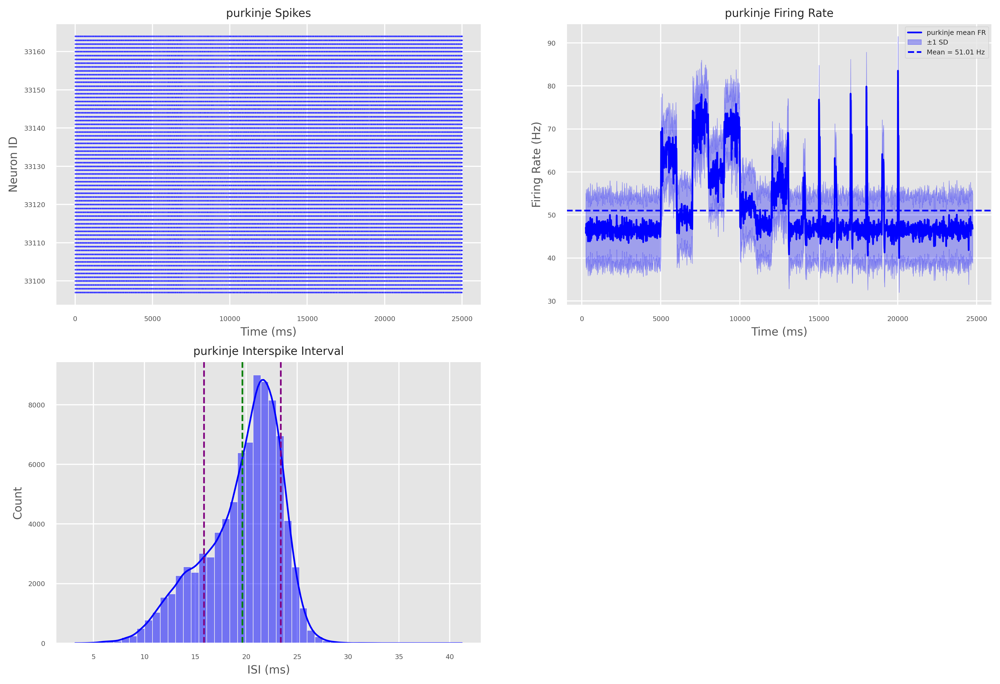

In [5]:
times_vectorPC, mean_ratePC, rates_per_neuronPC, stats_popPC, isi_dictPC, stats_dictPC = process_pop(df_spikes, "purkinje", color="blue", mask_flag=True, dt=5, sigma=20)

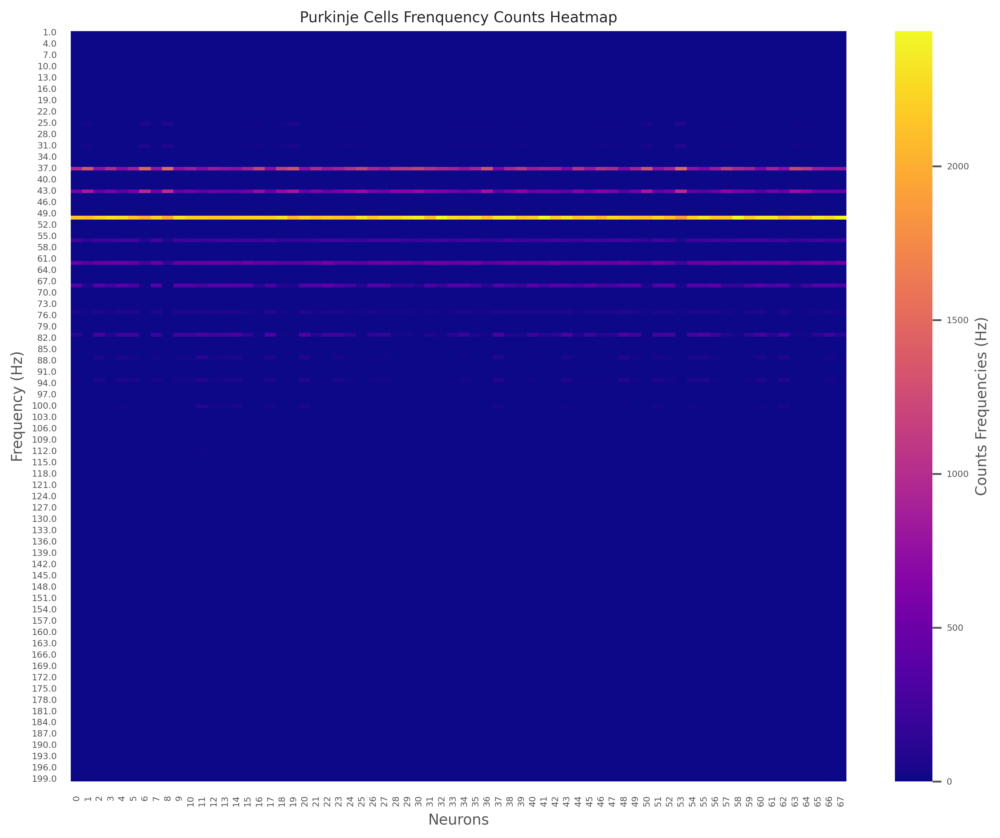

In [6]:
stimulus_heatmap = heatmap_firing_rates(rates_per_neuronPC)
plot_count_heatmap(stimulus_heatmap, "Purkinje Cells Frenquency Counts Heatmap")

In [7]:
print(f"Number of zero entries in heatmap: {(stimulus_heatmap == 0).sum().sum()}")
print(f"Number of total entries in stimulus_heatmap: {stimulus_heatmap.size}\n")

Number of zero entries in heatmap: 12613
Number of total entries in stimulus_heatmap: 13532



PCA explained variance ratio: [0.83297048 0.11332068]
PCA Summary:
PC1 explains 83.3% of variance
PC2 explains 11.3% of variance
Top contributing neurons: [19  1  6 53  8]


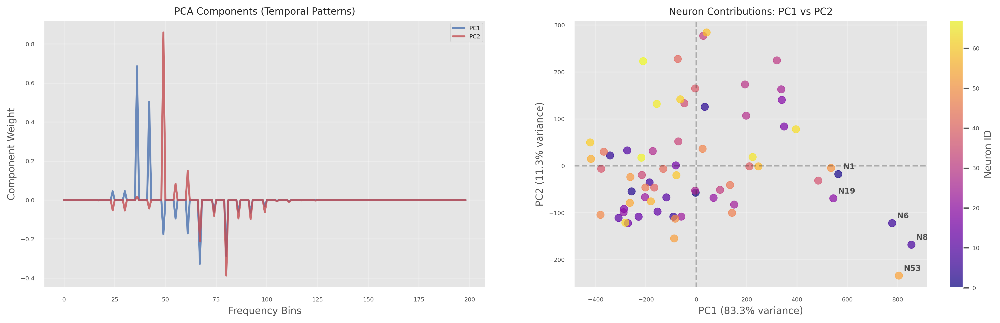

In [8]:
heatmap_pca, pca_obj = PCA_heatmap(stimulus_heatmap, n_components=2)
_ = plot_pca_analysis(stimulus_heatmap, pca_obj)

K-Means Clustering: 2 clusters
Silhouette Coefficient: 0.548


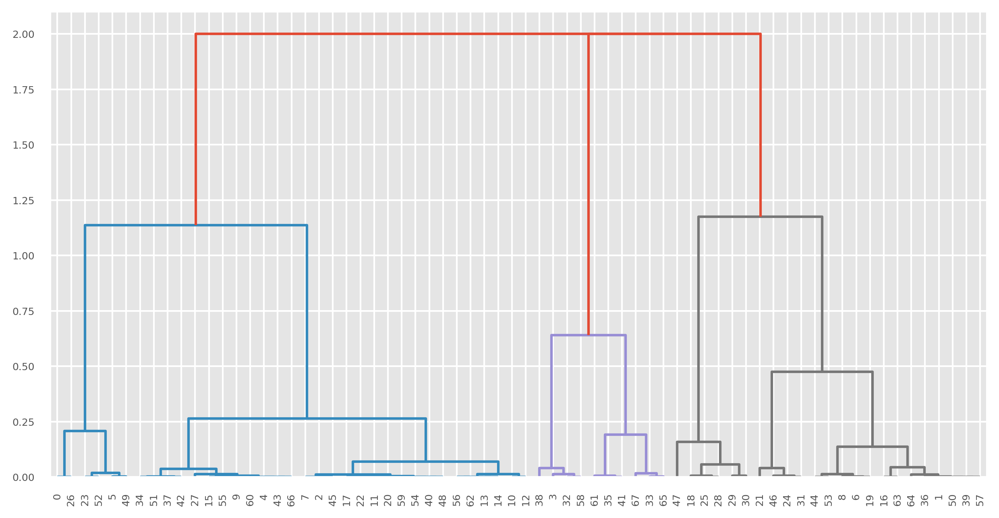

Hierarchical Clustering: 2 clusters
Silhouette Coefficient: 0.435
   Frequency Label
0  50.928382    ON
1  53.654866    ON
2  50.122424    ON
3  53.825750    ON
4  52.541573    ON


/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


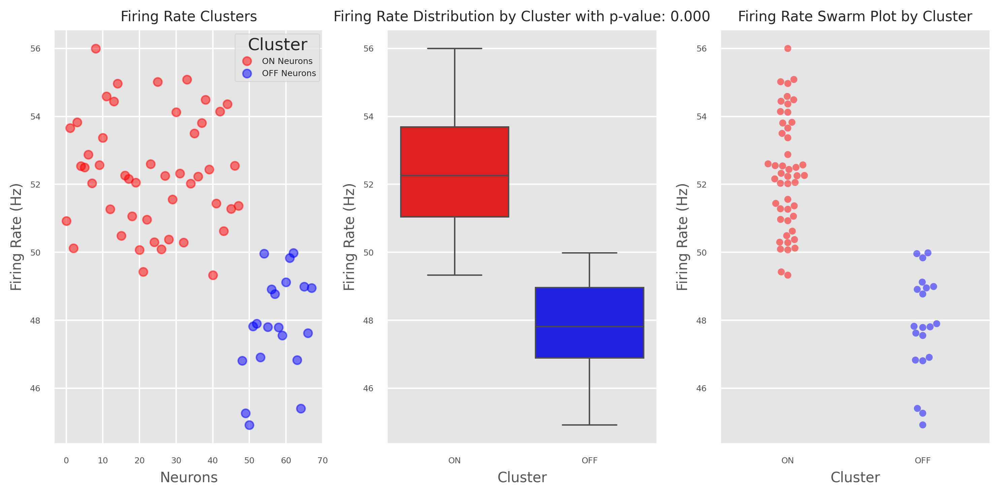

In [9]:
labels_stimulus = kmeans_cluster(heatmap_pca, n_clusters=2)
hierarchical_labels = hierarchical_cluster(heatmap_pca, n_clusters=2)
neuronsON, neuronsOFF = plot_fr_clusters(rates_per_neuronPC, labels_stimulus)

Shape: (119955, 2)
[[2.21000e+01 6.40000e+01]
 [2.39000e+01 1.24000e+02]
 [2.42000e+01 4.00000e+00]
 ...
 [2.49959e+04 8.00000e+01]
 [2.49960e+04 5.00000e+01]
 [2.49981e+04 1.10000e+02]]
Computing firing rates of basket
Number of neurons: 150
Time vector: 0 25000.9
Number of bins: 5001
Kernel size: 8
Neuron ID: 1.0
First few spikes: [ 24.1 253.9 418.1 493.4 566.2]
Neuron ID: 2.0
First few spikes: [ 24.9 418.5 599.5 658.3 748.9]
Neuron ID: 3.0
First few spikes: [ 24.   93.2 185.8 208.4 251.1]
Rates array shape: (150, 5001)
Rates array first few values: [[ 0.    6.25 18.75 ...  0.    0.    0.  ]
 [ 0.    6.25 18.75 ...  0.    0.    0.  ]
 [ 0.    6.25 18.75 ... 31.25 43.75 43.75]
 [ 0.    6.25 18.75 ... 43.75 43.75 31.25]
 [ 0.    6.25 18.75 ...  0.    0.    0.  ]]
Rates array first few neurons: [[ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.7

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils.py:242: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


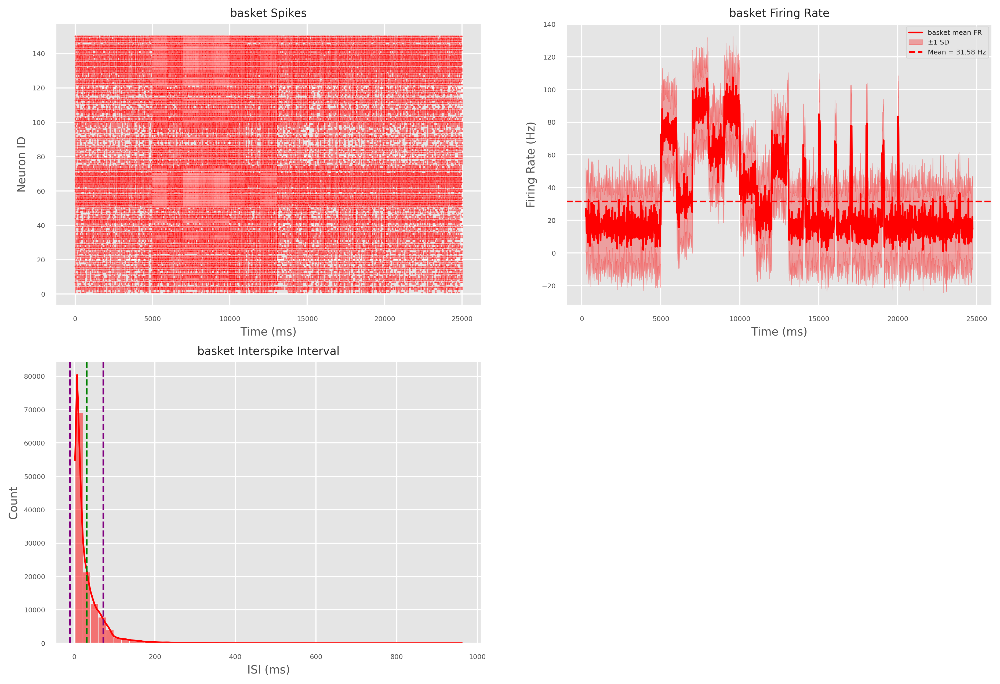

In [10]:
times_vectorBK, mean_rateBK, rates_per_neuronBK, stats_popBK, isi_dictBK, stats_dictBK = process_pop(df_spikes, "basket", color="red", mask_flag=True, dt=5, sigma=20)

10000.0
Computed power spectrum for 68 neurons with 512 frequency bins.
Frequency range: 9.77 - 5000.00 Hz
PSD shape: (68, 512)


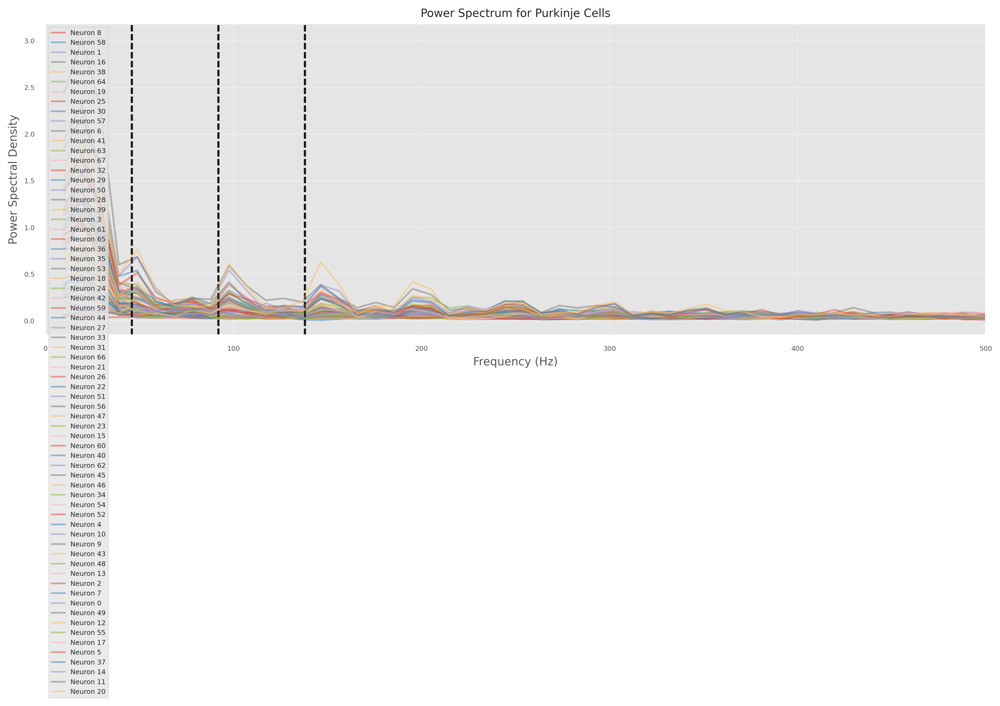

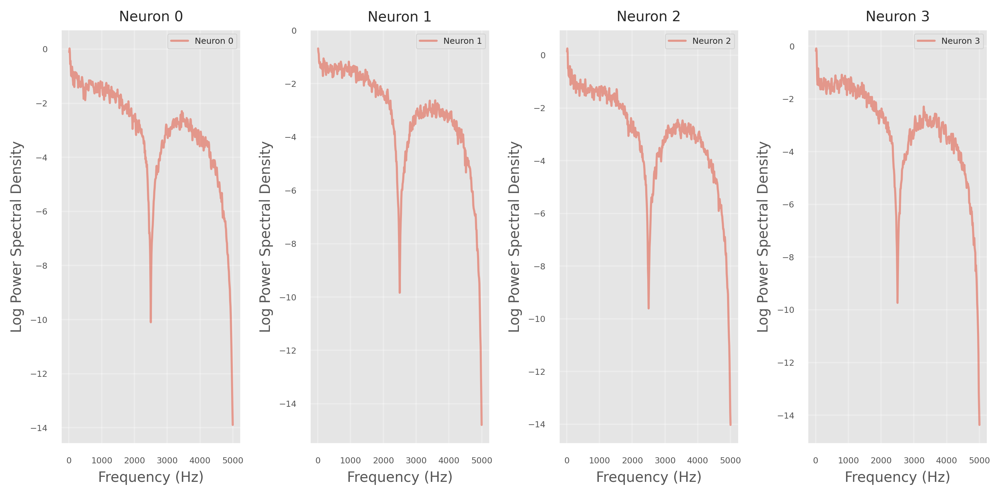

In [40]:
freqs_pc, psd_pc = compute_power_spectrum(rates_per_neuronPC, dt=0.1, nperseg=1024)

print(f"Frequency range: {freqs_pc[0]:.2f} - {freqs_pc[-1]:.2f} Hz")
print(f"PSD shape: {psd_pc.shape}")
plot_power_spectrum(freqs_pc, psd_pc, 'Purkinje Cells', n_neurons_to_plot=rates_per_neuronPC.shape[0])
plot_log_psd(freqs_pc, psd_pc, n_plot=4)

In [12]:
# Check for zero frequencies in the power spectrum
# This is to ensure that the power spectrum is computed correctly and does not contain any zero frequencies

np.sum(freqs_pc == 0.0)

np.int64(0)

10000.0
Computed power spectrum for 150 neurons with 512 frequency bins.
Frequency range: 9.77 - 5000.00 Hz
PSD shape: (150, 512)


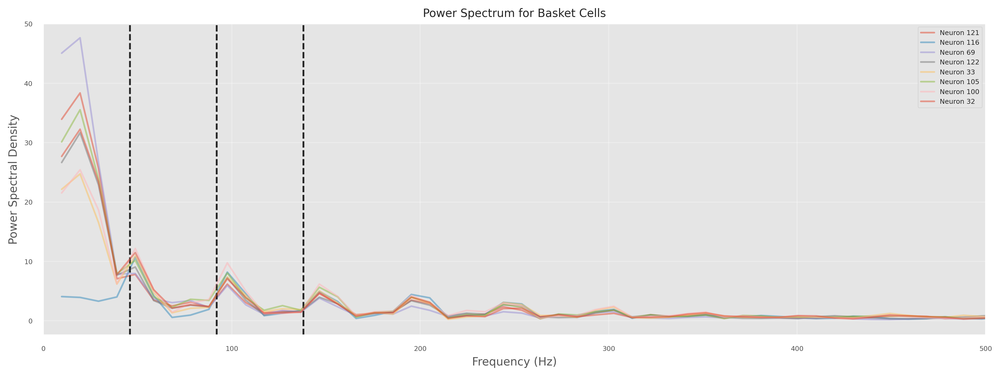

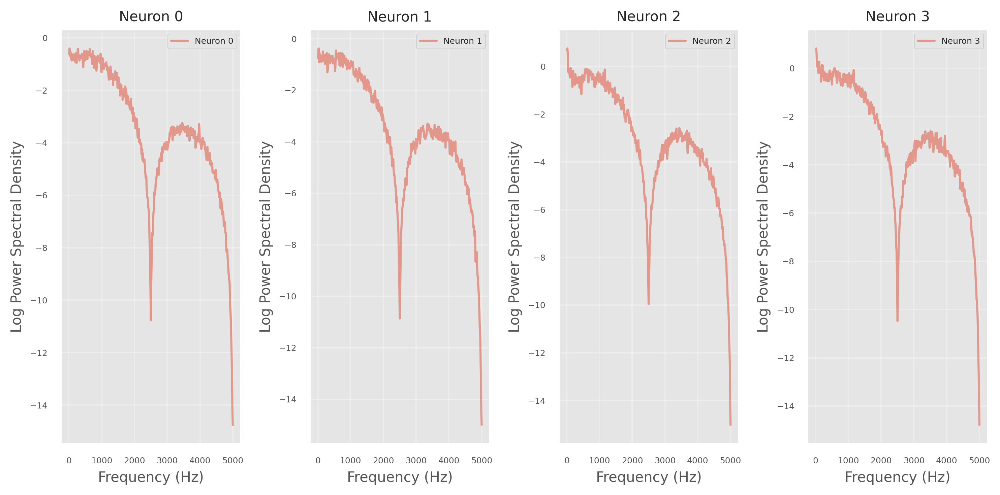

In [13]:
freqs_bk, psd_bk = compute_power_spectrum(rates_per_neuronBK, dt=0.1, nperseg=1024)
print(f"Frequency range: {freqs_bk[0]:.2f} - {freqs_bk[-1]:.2f} Hz")
print(f"PSD shape: {psd_bk.shape}")
plot_power_spectrum(freqs_bk, psd_bk, 'Basket Cells', n_neurons_to_plot=8)
plot_log_psd(freqs_bk, psd_bk, n_plot=4)

In [14]:
# veryfying the frequency range and shape of the power spectrum
print(f"Shape of psd_pc: {psd_pc.shape}")
print(f"minimum of freqs_pc: {freqs_pc[0]:.2f} Hz")
print(f"maximum of freqs_pc: {freqs_pc[-1]:.2f} Hz\n")

print(f"Shape of psd_bk: {psd_bk.shape}")
print(f"minimum of freqs_bk: {freqs_bk[0]:.2f} Hz")
print(f"maximum of freqs_bk: {freqs_bk[-1]:.2f} Hz")
print(f"Shape of psd_bk: {psd_bk.shape}")

Shape of psd_pc: (68, 512)
minimum of freqs_pc: 9.77 Hz
maximum of freqs_pc: 5000.00 Hz

Shape of psd_bk: (150, 512)
minimum of freqs_bk: 9.77 Hz
maximum of freqs_bk: 5000.00 Hz
Shape of psd_bk: (150, 512)


Shape of correlation matrix ON: (150, 48)
Shape of correlation matrix OFF: (150, 20)
Shape of combined correlation matrix: (150, 68)
X labels: [1, 6, 8, 16, 18, 19, 24, 25, 28, 29, 30, 36, 39, 44, 46, 50, 53, 57, 63, 64, 0, 2, 3, 4, 5, 7, 9, 10, 11, 12, 13, 14, 15, 17, 20, 21, 22, 23, 26, 27, 31, 32, 33, 34, 35, 37, 38, 40, 41, 42, 43, 45, 47, 48, 49, 51, 52, 54, 55, 56, 58, 59, 60, 61, 62, 65, 66, 67]
Min p-value: 0.0, Max p-value: 0.99668709834783
Significant p-values (alpha=0.05): 10038 out of 10200


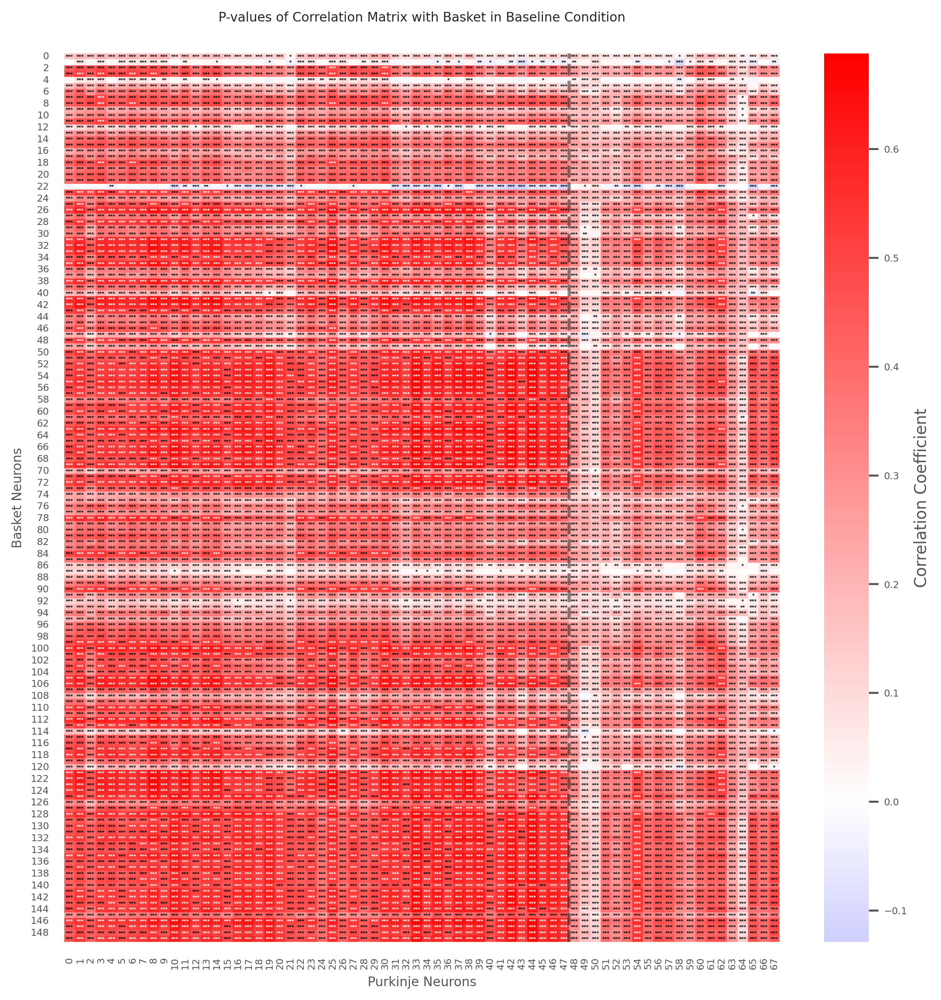

In [15]:
corr_matrixBKPC, neurons_bound, neuronsON, neuronsOFF = relate_basket_to_pc(rates_per_neuronBK, rates_per_neuronPC, clusters=labels_stimulus)
p_valuesPC = compute_pvalue(corr_matrixBKPC, dof=rates_per_neuronBK.shape[1] - 2)
plot_pvalue_corr(corr_matrixBKPC, p_valuesPC, neuronsOFF, neuronsON, title='P-values of Correlation Matrix with Basket in Baseline Condition', neurons_boundary=neurons_bound, alpha=0.05)

In [16]:
foof_features = extract_fooof_features(psd_pc, freqs_pc)

Low peak width limit: 19.53 Hz
For cell 0
error of the model: 1.0262
R^2 of the model: 0.4503

For cell 1
error of the model: 1.0335
R^2 of the model: 0.4256

For cell 2
error of the model: 0.5971
R^2 of the model: 0.7405

For cell 3
error of the model: 1.0181
R^2 of the model: 0.4352

For cell 4
error of the model: 1.0468
R^2 of the model: 0.4516

For cell 5
error of the model: 1.1171
R^2 of the model: 0.4191

For cell 6
error of the model: 1.0653
R^2 of the model: 0.4170

For cell 7
error of the model: 1.1162
R^2 of the model: 0.4191

For cell 8
error of the model: 1.0469
R^2 of the model: 0.4183

For cell 9
error of the model: 1.0813
R^2 of the model: 0.4348

For cell 10
error of the model: 1.1112
R^2 of the model: 0.4176

For cell 11
error of the model: 1.0434
R^2 of the model: 0.4665

For cell 12
error of the model: 1.0251
R^2 of the model: 0.4533

For cell 13
error of the model: 1.1139
R^2 of the model: 0.4112

For cell 14
error of the model: 1.0750
R^2 of the model: 0.4584

For 

In [17]:
foof_features.head()

,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,Total_Energy_Entire_PSD
0,2506.196511,2.541681,3000.000000,6.258619,3.403790,11.116178
1,2420.795249,2.713468,3000.000000,5.312257,3.171919,6.396967
2,3651.490985,3.489238,1048.809601,6.592022,3.517950,15.101413
3,2448.728657,2.537777,3000.000000,5.456817,3.174335,8.177196
4,3595.770919,3.258773,1123.872587,10.166907,4.346041,13.451512


In [18]:
mean_phase_per_neuronPC, std_phase_per_neuronPC  = hilbert_phase(rates_per_neuronPC)
foof_features['Mean_Phase'] = mean_phase_per_neuronPC
foof_features['Std_Phase'] = std_phase_per_neuronPC

Statistics:
Mean phase per neuron shape: (68,)
Std phase per neuron shape: (68,)
Mean phase per neuron: [3.13307437 6.13309471 3.10923899 3.04234044 3.01127001]
Std phase per neuron: [1.60024893 1.85717582 1.5613383  1.63322884 1.57031818]
Mean phase per neuron max: 6.137621094587218
Mean phase per neuron min: 0.06374937811473422


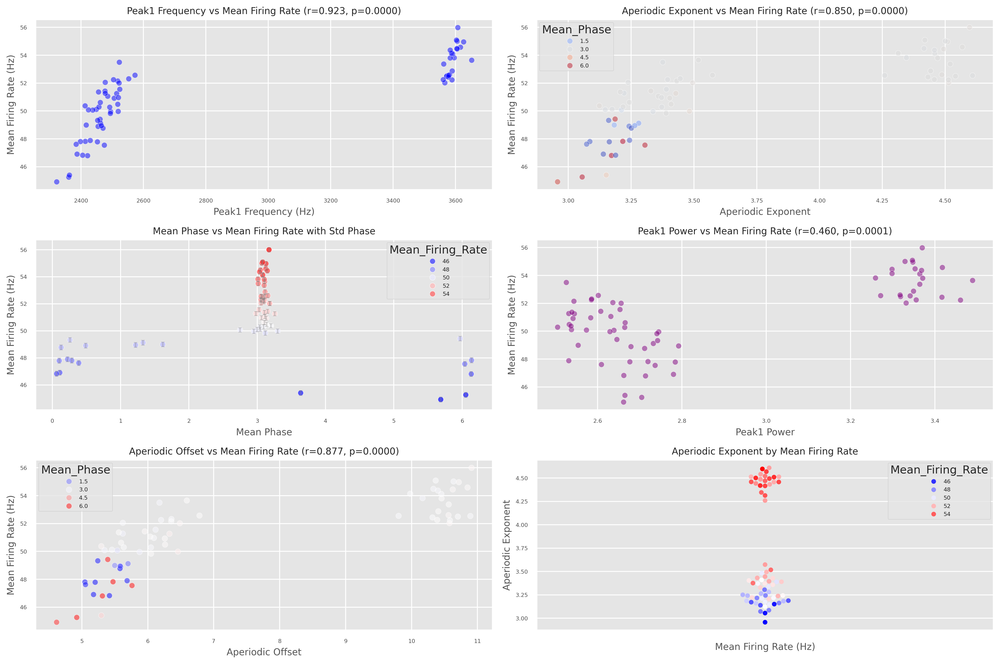

In [19]:
mean_rate = rates_per_neuronPC.mean(axis=1)
mean_rateBK = rates_per_neuronBK.mean(axis=1)
foof_features['Mean_Firing_Rate'] = mean_rate

fig, axs = plt.subplots(3, 2, figsize=(15, 10), dpi=300)

# Mean Freq vs Peak Freq
pvalue1, r1 = corr_pvalue(foof_features['Peak1_Freq'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Peak1_Freq', y='Mean_Firing_Rate', ax=axs[0, 0], color='blue', alpha=0.5)
axs[0, 0].set_title(f'Peak1 Frequency vs Mean Firing Rate (r={r1:.3f}, p={pvalue1:.4f})')
axs[0, 0].set_xlabel('Peak1 Frequency (Hz)')
axs[0, 0].set_ylabel('Mean Firing Rate (Hz)')

# Mean Freq vs Slope
pvalue2, r2 = corr_pvalue(foof_features['Aperiodic_Exponent'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Aperiodic_Exponent', y='Mean_Firing_Rate', hue='Mean_Phase', ax=axs[0, 1], palette='coolwarm', alpha=0.5)
axs[0, 1].set_title(f'Aperiodic Exponent vs Mean Firing Rate (r={r2:.3f}, p={pvalue2:.4f})')
axs[0, 1].set_xlabel('Aperiodic Exponent')
axs[0, 1].set_ylabel('Mean Firing Rate (Hz)')

# Scatter plot of mean_phase vs mean_firing_rate with std_phase as error bars
sns.scatterplot(data=foof_features, x='Mean_Phase', y='Mean_Firing_Rate', hue='Mean_Firing_Rate', palette='bwr', ax=axs[1, 0], alpha=0.7)
axs[1, 0].errorbar(foof_features['Mean_Phase'], foof_features['Mean_Firing_Rate'], 
                   yerr=foof_features['Std_Phase'] * 0.1, fmt='none', alpha=0.3, color='gray', capsize=2)
axs[1, 0].set_title('Mean Phase vs Mean Firing Rate with Std Phase')
axs[1, 0].set_xlabel('Mean Phase')
axs[1, 0].set_ylabel('Mean Firing Rate (Hz)')

# Power vs Mean Firing Rate
pvalue4, r4 = corr_pvalue(foof_features['Peak1_Power'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Peak1_Power', y='Mean_Firing_Rate', ax=axs[1, 1], color='purple', alpha=0.5)
axs[1, 1].set_title(f'Peak1 Power vs Mean Firing Rate (r={r4:.3f}, p={pvalue4:.4f})')
axs[1, 1].set_xlabel('Peak1 Power')
axs[1, 1].set_ylabel('Mean Firing Rate (Hz)')

# Aperiodic Offset vs Mean Firing Rate
pvalue5, r5 = corr_pvalue(foof_features['Aperiodic_Offset'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Aperiodic_Offset', y='Mean_Firing_Rate', hue='Mean_Phase', ax=axs[2, 0], palette='bwr', alpha=0.5)
axs[2, 0].set_title(f'Aperiodic Offset vs Mean Firing Rate (r={r5:.3f}, p={pvalue5:.4f})')
axs[2, 0].set_xlabel('Aperiodic Offset')
axs[2, 0].set_ylabel('Mean Firing Rate (Hz)')

# Swarm plot of aperiodic exponent by firing rate
sns.swarmplot(data=foof_features, y='Aperiodic_Exponent', hue='Mean_Firing_Rate', palette='bwr')
axs[2, 1].set_title('Aperiodic Exponent by Mean Firing Rate')
axs[2, 1].set_xlabel('Mean Firing Rate (Hz)')
axs[2, 1].set_ylabel('Aperiodic Exponent')

plt.tight_layout()
plt.show()

In [20]:
foof_features

,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,Total_Energy_Entire_PSD,Mean_Phase,Std_Phase,Mean_Firing_Rate
0,2506.196511,2.541681,3000.000000,6.258619,3.403790,11.116178,3.133074,1.600249,50.928382
1,2420.795249,2.713468,3000.000000,5.312257,3.171919,6.396967,6.133095,1.857176,46.806774
2,3651.490985,3.489238,1048.809601,6.592022,3.517950,15.101413,3.109239,1.561338,53.654866
3,2448.728657,2.537777,3000.000000,5.456817,3.174335,8.177196,3.042340,1.633229,50.122424
4,3595.770919,3.258773,1123.872587,10.166907,4.346041,13.451512,3.011270,1.570318,53.825750
...,...,...,...,...,...,...,...,...,...
63,2384.096836,2.608886,3000.000000,5.055912,3.072856,6.722094,0.388157,1.831857,47.621659
64,2465.189036,2.792144,3000.000000,5.581522,3.264514,7.715778,1.221180,1.771204,48.951745
65,2477.725435,2.531354,3000.000000,5.621405,3.222021,8.617852,2.981253,1.583430,51.280351
66,3577.936387,3.271045,1173.540066,9.803642,4.259563,10.353454,3.057272,1.571903,52.550500


aperiodic_component = offset - exponent × log₁₀(frequency)

log_residual = log₁₀(original_PSD) - aperiodic_component

linear_residual = 10^(log_residual)

In [21]:
def psd_without_aperiodic(psd, freqs, foof_features):
    """
    Remove the aperiodic component from the power spectrum.
    
    Args:
        psd: Power spectral density (2D array).
        freqs: Frequencies corresponding to the PSD.
        foof_features: DataFrame containing FOOOF features.

    Returns:
        psd_no_aperiodic: Power spectral density without the aperiodic component.
    """
    psd_no_aperiodic = np.zeros_like(psd)
    for i in range(psd.shape[0]):
        offset, exponent = foof_features.iloc[i][['Aperiodic_Offset', 'Aperiodic_Exponent']].values
        aperiodic_comp = offset - exponent * np.log10(freqs)
        log_residual = np.log10(psd[i]) - aperiodic_comp
        psd_no_aperiodic[i] = 10 ** log_residual
    return psd_no_aperiodic

psd_no_aperiodic = psd_without_aperiodic(psd_pc, freqs_pc, foof_features)

In [22]:
def psd_mask(freqs, psd, range_mask):
    """
    Mask the power spectral density based on the frequency mask.
    Args:
        freqs: frequencies corresponding to the power spectrum
        psd: power spectral density values (shape: n_neurons x n_freqs)
        range_mask: frequency range to mask (min, max)
    Returns:
        masked_psd: masked power spectral density
    """
    print(f"Frequencies spacing in psd: {freqs[1] - freqs[0]:.2f} Hz")
    freqs_mask = (freqs >= range_mask[0]) & (freqs <= range_mask[1])
    print(f"number of frequencies in the range {range_mask[0]}-{range_mask[1]} Hz: {np.sum(freqs_mask)}")
    extracted_freqs = freqs[freqs_mask]
    print(f"Extracted frequencies in the range: {extracted_freqs}")
    col_names = [f"{freq:.2f}Hz" for freq in extracted_freqs]
    
    psd_masked = pd.DataFrame(psd[:, freqs_mask], columns=col_names)
    print(f"Shape of psd_masked: {psd_masked.shape}")
    
    return psd_masked, freqs_mask

Frequencies spacing in psd: 9.77 Hz
number of frequencies in the range 20-70 Hz: 5
Extracted frequencies in the range: [29.296875 39.0625   48.828125 58.59375  68.359375]
Shape of psd_masked: (68, 5)
Shape of psd_pc_energy: (68,)


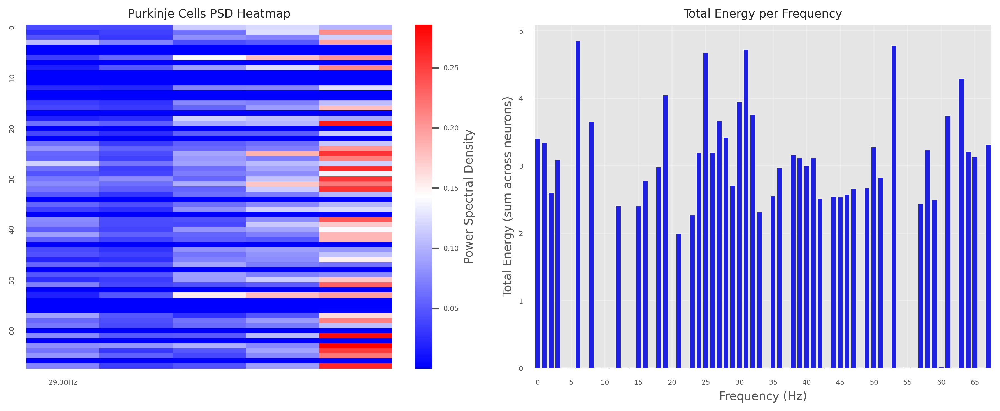

Frequency range: 29.3 - 68.4 Hz
Total energy across all frequencies: 145.95


In [23]:
psd_pc_masked, freqs_mask = psd_mask(freqs_pc, psd_no_aperiodic, range_mask=(20, 70))

# Calculate total energy per neuron (integral across frequencies)
psd_pc_energy = np.trapezoid(psd_pc_masked.values, dx=freqs_pc[1] - freqs_pc[0], axis=1)

print(f"Shape of psd_pc_energy: {psd_pc_energy.shape}")
psd_pc_energy = pd.DataFrame(psd_pc_energy, columns=['Energy'])
extracted_freqs = freqs_pc[freqs_mask]

fig, ax = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

# Left plot: PSD heatmap (neurons x frequencies)
ax[0].set_title('Purkinje Cells PSD Heatmap')
ax[0].set_xlabel('Frequency (Hz)')
ax[0].set_ylabel('Neurons')
sns.heatmap(psd_pc_masked, cmap='bwr', cbar_kws={'label': 'Power Spectral Density'}, 
            yticklabels=10, xticklabels=5, ax=ax[0])

# Right plot: Total energy per frequency
ax[1].set_title('Total Energy per Frequency')
ax[1].set_xlabel('Frequency (Hz)')
ax[1].set_ylabel('Total Energy (sum across neurons)')
sns.barplot(x=psd_pc_energy.index, y=psd_pc_energy['Energy'], color='blue', ax=ax[1])
ax[1].set_xticks(np.arange(0, len(psd_pc_energy.index), 5))
ax[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print some statistics
print(f"Frequency range: {extracted_freqs[0]:.1f} - {extracted_freqs[-1]:.1f} Hz")
print(f"Total energy across all frequencies: {np.sum(psd_pc_energy['Energy']):.2f}")

In [24]:
foof_features['Total_Energy'] = psd_pc_energy['Energy'].values

In [25]:
foof_features.head()

,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,Total_Energy_Entire_PSD,Mean_Phase,Std_Phase,Mean_Firing_Rate,Total_Energy
0,2506.196511,2.541681,3000.000000,6.258619,3.403790,11.116178,3.133074,1.600249,50.928382,3.407693
1,2420.795249,2.713468,3000.000000,5.312257,3.171919,6.396967,6.133095,1.857176,46.806774,3.340668
2,3651.490985,3.489238,1048.809601,6.592022,3.517950,15.101413,3.109239,1.561338,53.654866,2.603537
3,2448.728657,2.537777,3000.000000,5.456817,3.174335,8.177196,3.042340,1.633229,50.122424,3.086169
4,3595.770919,3.258773,1123.872587,10.166907,4.346041,13.451512,3.011270,1.570318,53.825750,0.017503


In [26]:
foof_features.to_csv('/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/foof_features_stimulus.csv', index=False)

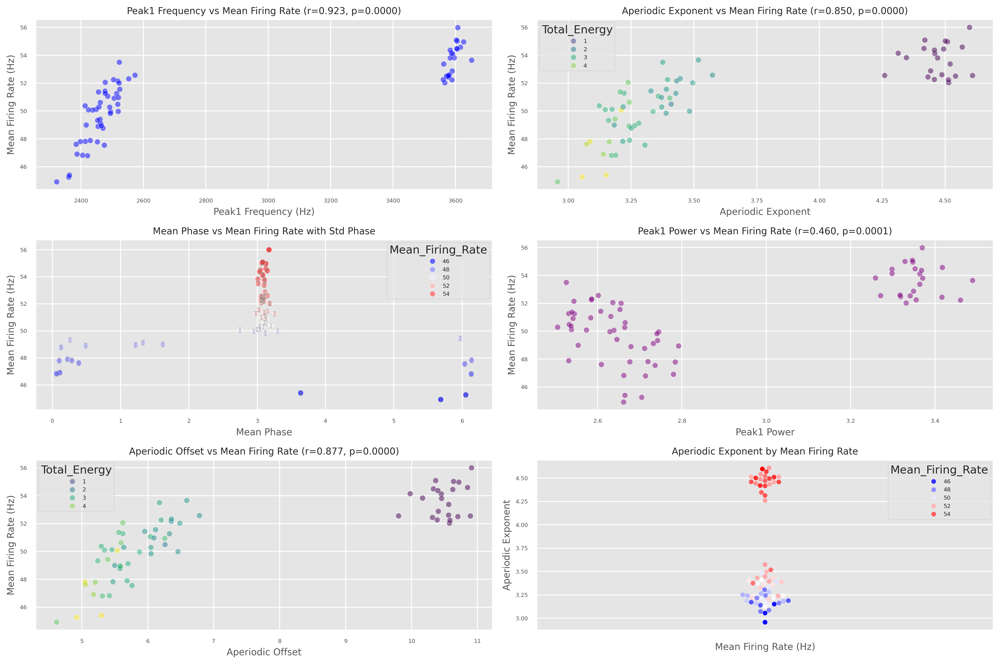

In [27]:
mean_rate = rates_per_neuronPC.mean(axis=1)
mean_rateBK = rates_per_neuronBK.mean(axis=1)
foof_features['Mean_Firing_Rate'] = mean_rate

fig, axs = plt.subplots(3, 2, figsize=(15, 10), dpi=300)

# Mean Freq vs Peak Freq
pvalue1, r1 = corr_pvalue(foof_features['Peak1_Freq'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Peak1_Freq', y='Mean_Firing_Rate', ax=axs[0, 0], color='blue', alpha=0.5)
axs[0, 0].set_title(f'Peak1 Frequency vs Mean Firing Rate (r={r1:.3f}, p={pvalue1:.4f})')
axs[0, 0].set_xlabel('Peak1 Frequency (Hz)')
axs[0, 0].set_ylabel('Mean Firing Rate (Hz)')

# Mean Freq vs Slope
pvalue2, r2 = corr_pvalue(foof_features['Aperiodic_Exponent'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Aperiodic_Exponent', y='Mean_Firing_Rate', hue='Total_Energy', ax=axs[0, 1], palette='viridis', alpha=0.5)
axs[0, 1].set_title(f'Aperiodic Exponent vs Mean Firing Rate (r={r2:.3f}, p={pvalue2:.4f})')
axs[0, 1].set_xlabel('Aperiodic Exponent')
axs[0, 1].set_ylabel('Mean Firing Rate (Hz)')

# Scatter plot of mean_phase vs mean_firing_rate with std_phase as error bars
sns.scatterplot(data=foof_features, x='Mean_Phase', y='Mean_Firing_Rate', hue='Mean_Firing_Rate', palette='bwr', ax=axs[1, 0], alpha=0.7)
axs[1, 0].errorbar(foof_features['Mean_Phase'], foof_features['Mean_Firing_Rate'], 
                   yerr=foof_features['Std_Phase'] * 0.1, fmt='none', alpha=0.3, color='gray', capsize=2)
axs[1, 0].set_title('Mean Phase vs Mean Firing Rate with Std Phase')
axs[1, 0].set_xlabel('Mean Phase')
axs[1, 0].set_ylabel('Mean Firing Rate (Hz)')

# Power vs Mean Firing Rate
pvalue4, r4 = corr_pvalue(foof_features['Peak1_Power'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Peak1_Power', y='Mean_Firing_Rate', ax=axs[1, 1], color='purple', alpha=0.5)
axs[1, 1].set_title(f'Peak1 Power vs Mean Firing Rate (r={r4:.3f}, p={pvalue4:.4f})')
axs[1, 1].set_xlabel('Peak1 Power')
axs[1, 1].set_ylabel('Mean Firing Rate (Hz)')

# Aperiodic Offset vs Mean Firing Rate
pvalue5, r5 = corr_pvalue(foof_features['Aperiodic_Offset'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Aperiodic_Offset', y='Mean_Firing_Rate', hue='Total_Energy', ax=axs[2, 0], palette='viridis', alpha=0.5)
axs[2, 0].set_title(f'Aperiodic Offset vs Mean Firing Rate (r={r5:.3f}, p={pvalue5:.4f})')
axs[2, 0].set_xlabel('Aperiodic Offset')
axs[2, 0].set_ylabel('Mean Firing Rate (Hz)')

# Swarm plot of aperiodic exponent by firing rate
sns.swarmplot(data=foof_features, y='Aperiodic_Exponent', hue='Mean_Firing_Rate', palette='bwr')
axs[2, 1].set_title('Aperiodic Exponent by Mean Firing Rate')
axs[2, 1].set_xlabel('Mean Firing Rate (Hz)')
axs[2, 1].set_ylabel('Aperiodic Exponent')

plt.tight_layout()
plt.show()

In [28]:
foof_features.to_csv("/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/foof_features_stimulus.csv", index=False)

In [29]:
results_corr = bk_pc_exponent_analysis(foof_features, rates_per_neuronBK, rates_per_neuronPC, labels_stimulus)

Shape of population basket activity: (4901,)
Shape of population PC activity: (4901,)
Shape of mean PC rates: (68,)
Population basket-PC correlation: 0.841 and p-value: 0.0000
PC firing rate vs aperiodic exponent correlation: 0.850 and p-value: 0.0000
PC-basket correlation strength vs aperiodic exponent: 0.856, p:0.0000
ON neurons - PC-basket corr vs aperiodic exp: 0.771, p:0.0000
OFF neurons - PC-basket corr vs aperiodic exp: 0.722, p:0.0003


In [30]:
results_corr['Cluster'] = labels_stimulus

In [31]:
results_corr

,pop_correlation,pc_rate_exp_corr,corr_strength_exp_relation,pc_basket_correlations,exponents,Cluster
0,0.841477,0.850021,0.855632,0.555372,3.403790,1
1,0.841477,0.850021,0.855632,0.320788,3.171919,0
2,0.841477,0.850021,0.855632,0.627667,3.517950,1
3,0.841477,0.850021,0.855632,0.492401,3.174335,1
4,0.841477,0.850021,0.855632,0.626246,4.346041,1
...,...,...,...,...,...,...
63,0.841477,0.850021,0.855632,0.410982,3.072856,0
64,0.841477,0.850021,0.855632,0.426295,3.264514,0
65,0.841477,0.850021,0.855632,0.544035,3.222021,1
66,0.841477,0.850021,0.855632,0.607896,4.259563,1


In [32]:
# results_corr.to_csv("/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/correlation_results_stimulus.csv", index=False)

Overall correlation between PC-basket strength and aperiodic exponent: 0.856 (p=0.0000)


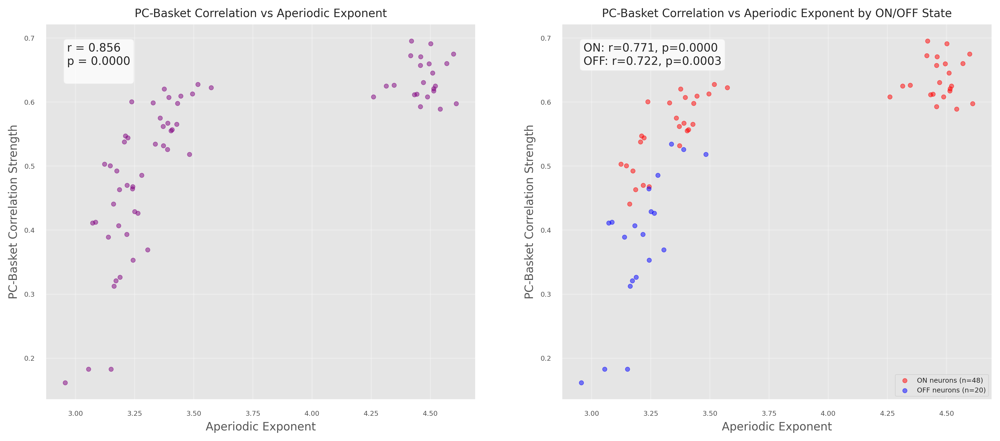

In [33]:
plot_pc_basket_vs_exponent(results_corr, labels_stimulus)

Shape of centered ratesPC: (68, 4901)
Shape of mean_BK: (4901,)
Estimated Mutual Information: [0.33224159 0.11394046 0.44017054 0.26509142 0.44071214 0.42395192
 0.05834534 0.38630775 0.01927997 0.41420974 0.40051218 0.54649222
 0.38942576 0.44633747 0.46831193 0.34057804 0.15765251 0.4734105
 0.1463463  0.13654609 0.47718232 0.30889442 0.35672404 0.39792587
 0.3011645  0.14747994 0.33993347 0.34651138 0.19450171 0.16126157
 0.12585336 0.27614493 0.21627196 0.36755267 0.3922159  0.25956092
 0.18415768 0.51587572 0.23887983 0.26627068 0.40483049 0.27458537
 0.34395738 0.49974185 0.29230134 0.36284654 0.27432161 0.28742115
 0.48867131 0.38494597 0.09655693 0.41441316 0.44282599 0.06785748
 0.45376098 0.48448656 0.39409904 0.16318326 0.20860982 0.34233516
 0.41983044 0.24796806 0.4852589  0.14793404 0.19250567 0.28590197
 0.39248514 0.28780736]


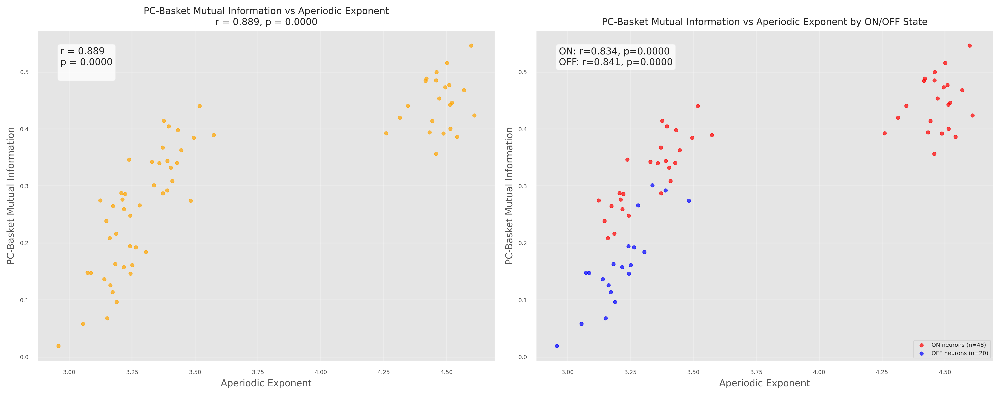

Overall correlation between PC-basket MI and aperiodic exponent: 0.889 (p=0.0000)


In [34]:
est_MI = mutual_info(rates_per_neuronPC, rates_per_neuronBK)
plot_pc_basketMI_vs_exponent(est_MI, foof_features, labels_stimulus)

Explained variance by components with 2 components: 0.6049418064737395
Explained variance by components with 4 components: 0.6292962689023741
Explained variance by components with 6 components: 0.6456320756795885
Explained variance by components with 8 components: 0.6615408983185339
Explained variance by components with 10 components: 0.6768449491019494
Explained variance by components with 12 components: 0.6917271390656029
Explained variance by components with 14 components: 0.7062409921816548
Explained variance by components with 16 components: 0.7203969482879632
Explained variance by components with 18 components: 0.7342755908857628
Explained variance by components with 20 components: 0.7477990064377599
Explained variance by components with 22 components: 0.7610465836198955
Explained variance by components with 24 components: 0.7740412092871307
Explained variance by components with 26 components: 0.7868366596728614
Explained variance by components with 28 components: 0.7993601607281

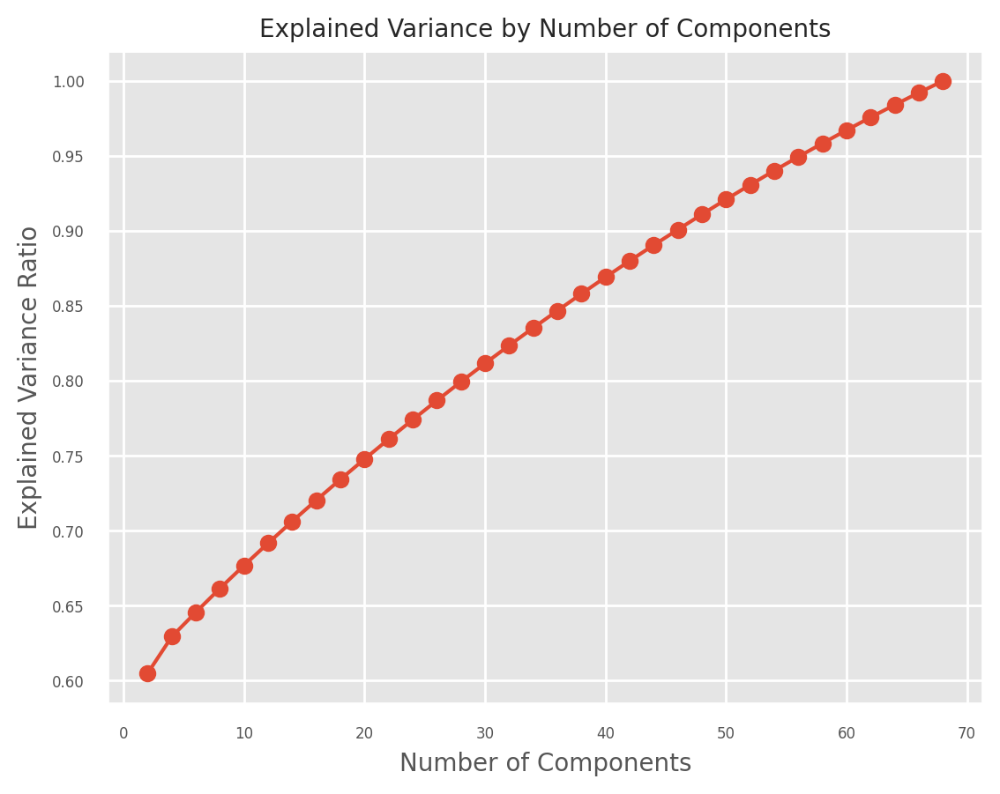

Optimal number of components based on gradient: 2
ICA features shape: (4901, 2)


(68, 2)

In [35]:
from sklearn.decomposition import FastICA, PCA

def perform_ica(features, n_components=None, try_components=False):
    """
    Perform Independent Component Analysis (ICA) on the feature matrix.
    """
    components = [i for i in range(2, features.shape[1] + 1, 2)]
    components_var = np.zeros((len(components),))
    if try_components:
        for i, comp in enumerate(components):
            pca = PCA(n_components=comp, random_state=1, whiten=True)
            pca_features = pca.fit_transform(features)
            explained_variance = pca.explained_variance_ratio_.sum()
            print(f"Explained variance by components with {comp} components: {explained_variance}")
            components_var[i] = np.sum(explained_variance)
        
        plt.plot(components, components_var, marker='o')
        plt.xlabel('Number of Components')
        plt.ylabel('Explained Variance Ratio')
        plt.title('Explained Variance by Number of Components')
        plt.grid(True)
        plt.show()

        gradient = np.gradient(components_var)
        optimal_components = components[np.argmax(gradient)]
        print(f"Optimal number of components based on gradient: {optimal_components}")

        ica = FastICA(n_components=optimal_components, random_state=1)
        ica_features = ica.fit_transform(features)

        print(f"ICA features shape: {ica_features.shape}")
    else:
        ica = FastICA(n_components=n_components, random_state=1)
        ica_features = ica.fit_transform(features)
        print(f"ICA features shape: {ica_features.shape}")
    return ica_features, ica

ica_features_pc, ica = perform_ica(rates_per_neuronPC.T, n_components=None, try_components=True)

ica.mixing_.shape

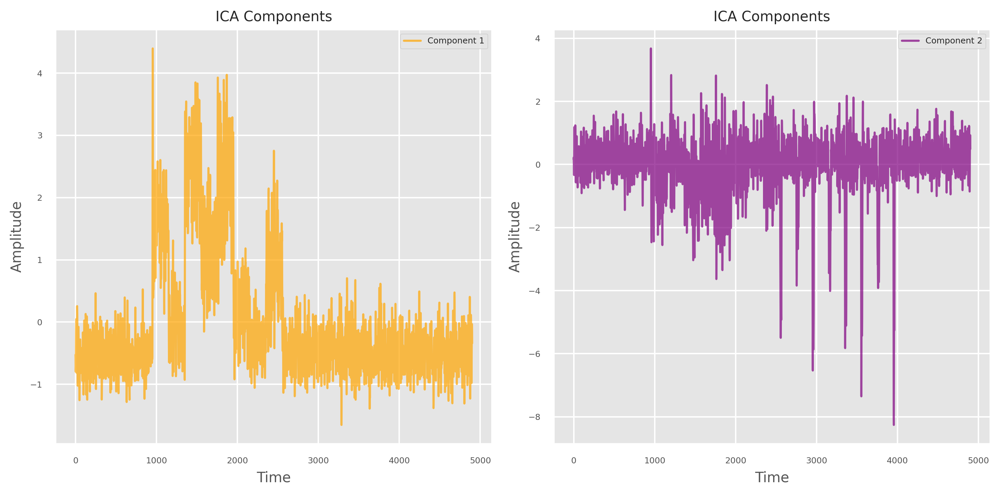

In [ ]:
def plot_ICA_components(ica_features, n_components=5):
    """
    Plot the independent components obtained from ICA.
    """
    fig, axes = plt.subplots(1, n_components, figsize=(15, 4), dpi=300)
    
    # Use viridis colormap to match the neuron firing rate visualization
    colors_comp = sns.color_palette('viridis', n_colors=n_components)
    
    for i in range(n_components):
        axes[i].plot(ica_features[:, i], color=colors_comp[i], alpha=0.8, linewidth=2)
        axes[i].set_title(f'ICA Component {i+1}', fontsize=10)
        axes[i].set_xlabel('Time', fontsize=8)
        axes[i].set_ylabel('Amplitude', fontsize=8)
        axes[i].grid(True, alpha=0.3)
        axes[i].tick_params(axis='both', which='major', labelsize=6)
    
    plt.suptitle('Independent Components from ICA Analysis', fontsize=14)
    plt.tight_layout()
    plt.show()

plot_ICA_components(ica_features_pc, n_components=5)

Shape of mixing matrix: (68, 2)


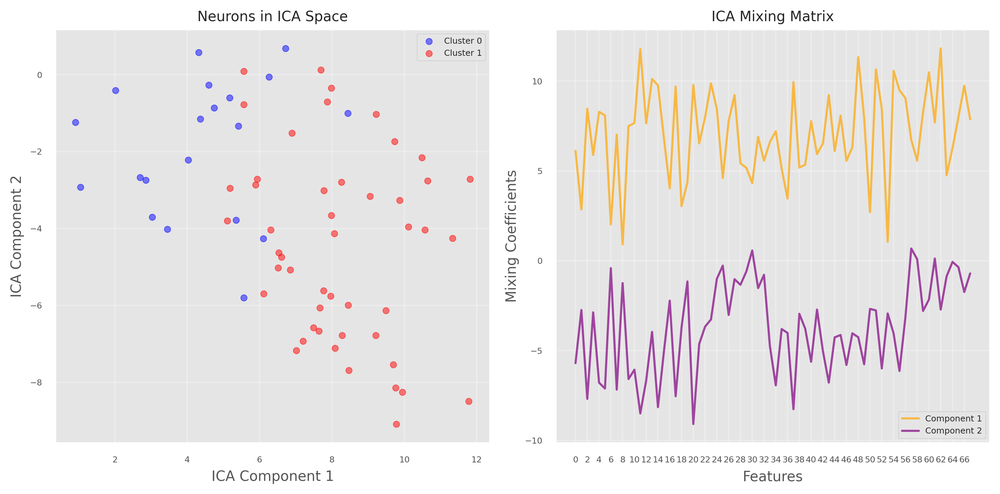

In [39]:
def plot_mixing_matrix(mixing_matrix, n_components=5, clusters=None):
    """
    Plot the mixing matrix obtained from ICA.
    """
    fig, axs = plt.subplots(1, 2, figsize=(10, 5), dpi=300)
    
    for i in range(n_components):
        colors_comp = ['orange', 'purple']
        axs[1].plot(mixing_matrix[:, i], label=f'Component {i+1}', alpha=0.7, color=colors_comp[i])
    
        axs[1].set_title('ICA Mixing Matrix')
        axs[1].set_xlabel('Features')
        axs[1].set_ylabel('Mixing Coefficients')
        axs[1].grid(True, alpha=0.3)
        axs[1].set_xticks(np.arange(0, mixing_matrix.shape[0], 2))
        axs[1].legend()

    print(f"Shape of mixing matrix: {mixing_matrix.shape}")
    # neurons scatter plot in ICA space
    if clusters is not None:
        unique_clusters = np.unique(clusters)
        if len(unique_clusters) == 2:
            colors = ['blue', 'red']
        else:
            colors = plt.cm.get_cmap('tab10', len(unique_clusters))
        for cluster in unique_clusters:
            cluster_indices = np.where(clusters == cluster)[0]
            axs[0].scatter(mixing_matrix[cluster_indices, 0], mixing_matrix[cluster_indices, 1], 
                           alpha=0.5, s=20, label=f'Cluster {cluster}', color=colors[cluster])
        axs[0].legend()
    else:
        axs[0].scatter(mixing_matrix[:, 0], mixing_matrix[:, 1], alpha=0.5, s=10, color='blue')
    axs[0].set_title('Neurons in ICA Space')
    axs[0].set_xlabel('ICA Component 1')
    axs[0].set_ylabel('ICA Component 2')
    axs[0].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_mixing_matrix(ica.mixing_, n_components=2, clusters=labels_stimulus)